<a href="https://colab.research.google.com/github/neuralsrg/SupervisedLearning/blob/main/Tensorflow/neural_style_transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Style Transfer

In [1]:
import tensorflow as tf
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

## Preparing images

In [65]:
! rm -rf /content/images
! mkdir /content/images
! wget https://qph.cf2.quoracdn.net/main-qimg-5227e751ba38c3663f0329e6f51b9191-lq -q -O /content/images/content.jpg
! wget https://miro.medium.com/max/900/0*-PmhOr8-OONl5SGQ.jpg -q -O /content/images/style.jpg

In [66]:
! rm -rf /content/images/.ipynb_checkpoints

In [67]:
def load_img(path):
  '''
  Loads image stored in /path/

  Args:
  path -- string - path to image 

  Returns:
  img -- float image in [0, 1] color scale
  '''
  max_dim = 512
  img = tf.io.read_file(path)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [68]:
def tensor_to_image(tensor):
  """
  Converts the given tensor into a PIL image
  
  Arguments:
  tensor -- Tensor
  
  Returns:
  Image: A PIL image
  """
  tensor = tensor * 255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor) > 3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return Image.fromarray(tensor)

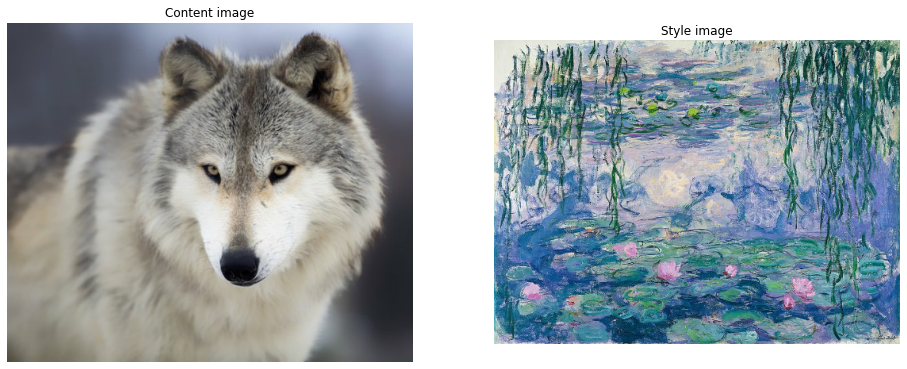

In [70]:
import os 

path = '/content/images'

content_image = load_img(os.path.join(path, 'content.jpg'))
style_image = load_img(os.path.join(path, 'style.jpg'))

fig = plt.figure(figsize=(16, 8))

ax = fig.add_subplot(121)
ax.set_title('Content image')
plt.axis('off')
ax.imshow(tensor_to_image(content_image))

ax = fig.add_subplot(122)
ax.set_title('Style image')
plt.axis('off')
ax.imshow(tensor_to_image(style_image))

## Loading pretrained VGG19

In [43]:
# vgg model
vgg = tf.keras.applications.VGG19(include_top=False,
                                  weights='imagenet')

# preprocessing

# will convert the input images from RGB to BGR, then will zero-center
# each color channel with respect to the ImageNet dataset, without scaling
preprocess_image = tf.keras.applications.vgg19.preprocess_input

In [44]:
vgg.trainable = False
vgg.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

## Loss functions



In [45]:
def content_cost(a_c, a_g):
  '''
  Computes content cost

  Args:
  a_c -- content image activation (python list)
  a_g -- generated image activation (python list)

  Returns:
  Cost -- tf tensor of shape()
  '''
  # extracting a_c and a_g from python list
  assert len(a_c) == 1
  a_c = a_c[0]
  a_g = a_g[0]

  shape = a_c.shape
  cost = 1/(4.0 * shape[1] * shape[2] * shape[3]) * tf.square(tf.norm(a_c - a_g))

  return cost

def style_layer_cost(a_s, a_g):
  '''
  Computes style cost per single layer

  Args:
  as -- style image activation
  ag -- generated image activation

  Returns:
  Cost -- tf tensor of shape()
  '''
  shape = a_s.shape

  # each column will represent a color channel
  a_s = tf.reshape(a_s, [-1, a_s.shape[-1]])
  a_g = tf.reshape(a_g, [-1, a_g.shape[-1]]) 

  # compute correlations between color channels (rows)
  corr_s = tf.matmul(tf.transpose(a_s), a_s)
  corr_g = tf.matmul(tf.transpose(a_g), a_g)

  cost = 1/(4.0 * (shape[1] * shape[2] * shape[3])**2) \
      * tf.square(tf.norm(corr_s - corr_g))

  return cost

In [46]:
def style_cost(A_s, A_g, layers_weights):
  '''
  Computes overall style cost

  Args:
  A_s -- style image activations
  A_g -- generated image activations
  layers_weights -- weights per each layer

  Returns:
  Cost -- tf tensor of shape()
  '''

  # overall cost
  cost = 0

  for i, layer in enumerate(layers_weights):
    layer_cost = style_layer_cost(A_s[i], A_g[i])
    cost += layer * layer_cost # weighted cost

  return cost

In [47]:
@tf.function()
def cost(J_c, J_s, alpha=1, beta=4):
  '''
  Computes final cost

  Args:
  J_c -- content cost
  J_s -- style cost

  Returns:
  Cost -- tf tensor of shape()
  '''
  return J_c * alpha + J_s * beta

## Choosing layers to track activations from

In [48]:
for layer in vgg.layers:
    print(layer.name)

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [49]:
# define layers to retrieve activations from 
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

style_weights = [.1, .3, .4, .5, 1]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

## Extracting activations

In [50]:
def retrieve_layers(layer_names):

  outputs = [vgg.get_layer(name).output for name in layer_names]
  model = tf.keras.Model([vgg.input], outputs)
  
  return model

In [51]:
class StyleContentModel(tf.keras.models.Model):

  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = retrieve_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    return content_outputs, style_outputs

In [71]:
extractor = StyleContentModel(style_layers, content_layers)

In [72]:
# encoded targets
content_encoding, _ = extractor(tf.constant(content_image))
_, style_encodings = extractor(tf.constant(style_image))

## Training

In [73]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
style_weight = 1e-2
content_weight = 1e4

epochs = 1000

In [74]:
train_image = tf.Variable(content_image, trainable=True)

In [76]:
@tf.function
def train_step(image, alpha=content_weight, beta=style_weight):

  with tf.GradientTape() as tape:
    #retrieving activations
    a_GC, a_GS = extractor(image)

    J_content = content_cost(content_encoding, a_GC)
    J_style = style_cost(style_encodings, a_GS, style_weights)
  
    J = cost(J_content, J_style, alpha, beta)

  grad = tape.gradient(J, image)
  optimizer.apply_gradients([(grad, image)])

  # clip [0, 1]
  image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0))

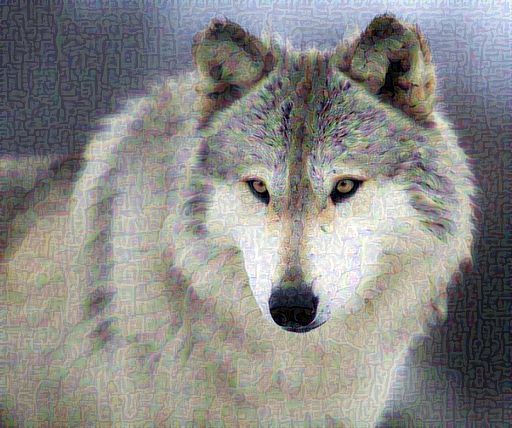

In [77]:
train_step(train_image)
train_step(train_image)
train_step(train_image)
tensor_to_image(train_image)

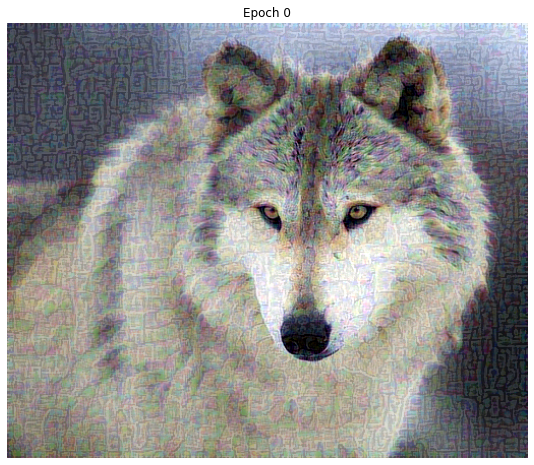

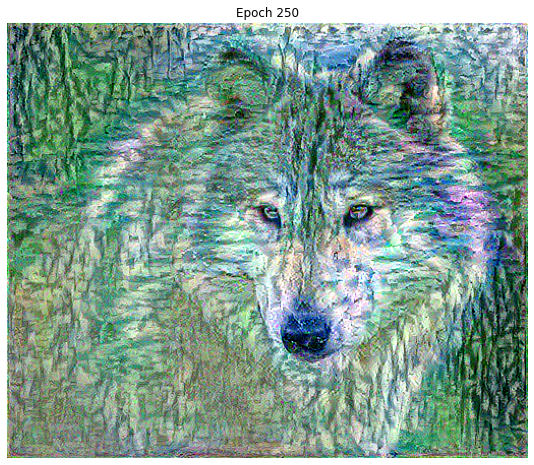

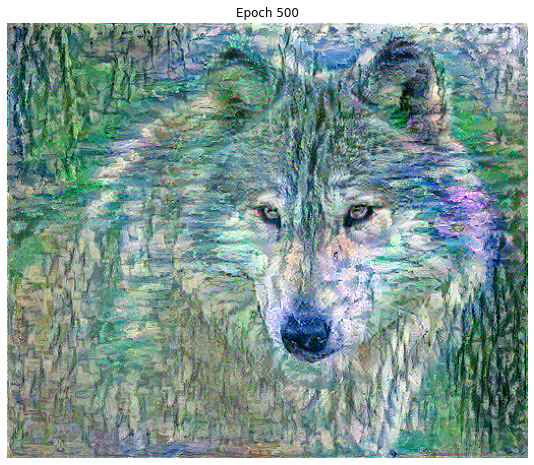

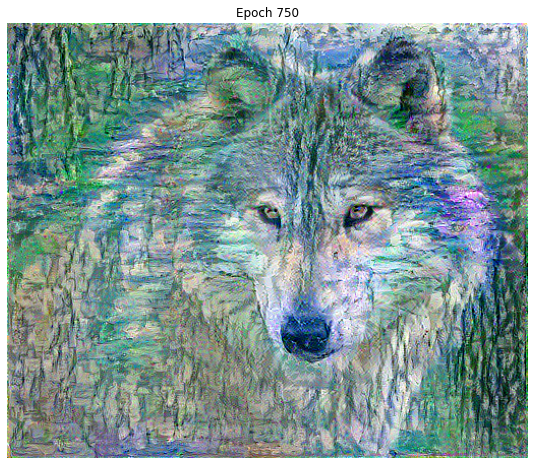

In [78]:
# training

for i in range(epochs):
  train_step(train_image, alpha=content_weight, beta=style_weight)

  if i % 250 == 0:
    image = tensor_to_image(train_image)
    plt.figure(figsize=(16, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f'Epoch {i}')
    plt.show() 

## Dealing with total variation loss

In [35]:
def plot_sobel_edges(image, label='Before transfer'):
  '''
  Plots Sobel filtered image

  Args:
  image -- tf tensor of shape (1, H, W, C)

  Returns: None
  '''
  sobel = tf.image.sobel_edges(image)
  sobel = sobel / 4 + 0.5 # recommended by tf 
  sobel = tf.clip_by_value(sobel, clip_value_min=0.0, clip_value_max=1.0)

  sobel_y = np.asarray(sobel[0, :, :, :, 0]) # sobel in y-direction
  sobel_x = np.asarray(sobel[0, :, :, :, 1])

  fig = plt.figure(figsize=(16, 8))
  ax = fig.add_subplot(121)
  ax.imshow(sobel_y[..., 0], cmap='gray')
  plt.axis('off')
  ax.set_title(f'x-direction {label}')

  ax = fig.add_subplot(122)
  ax.imshow(sobel_x[..., 0], cmap='gray')
  plt.axis('off')
  ax.set_title(f'y-direction {label}')

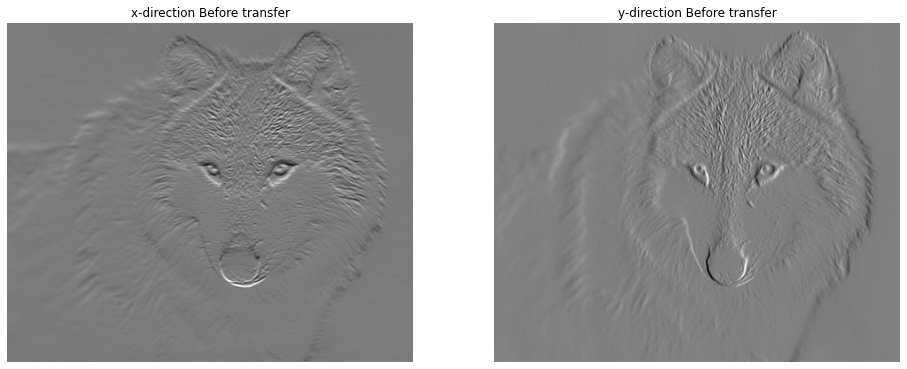

In [79]:
plot_sobel_edges(content_image)

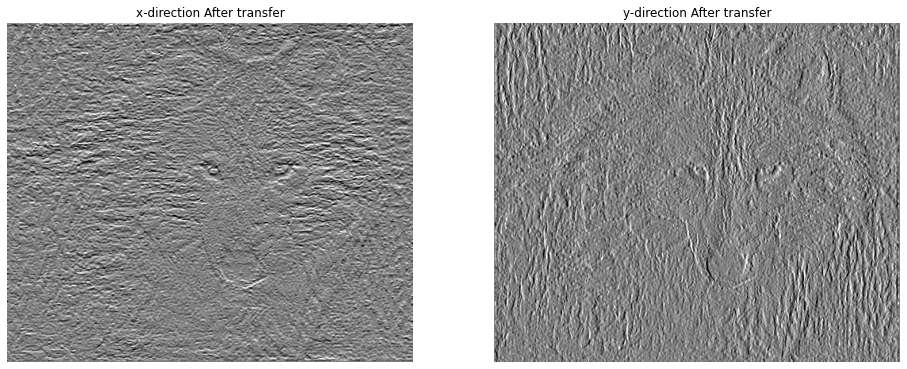

In [80]:
plot_sobel_edges(train_image, label='After transfer')

In [81]:
# EXPLANATION OF HOW tf.image.total_variation WORKS

@tf.function
def total_variation_loss(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return tf.reduce_sum(tf.abs(x_var)) + tf.reduce_sum(tf.abs(y_var))

In [82]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
train_image = tf.Variable(content_image, trainable=True)

variation_weight = 30

@tf.function
def train_step(image, alpha=content_weight, beta=style_weight):

  with tf.GradientTape() as tape:

    a_GC, a_GS = extractor(image)

    J_content = content_cost(content_encoding, a_GC)
    J_style = style_cost(style_encodings, a_GS, style_weights)
  
    J = cost(J_content, J_style, alpha, beta)
    #J += variation_weight * total_variation_loss(train_image)
    J += variation_weight * tf.image.total_variation(train_image)

  grad = tape.gradient(J, image)
  optimizer.apply_gradients([(grad, image)])

  # clip [0, 1]
  image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0))

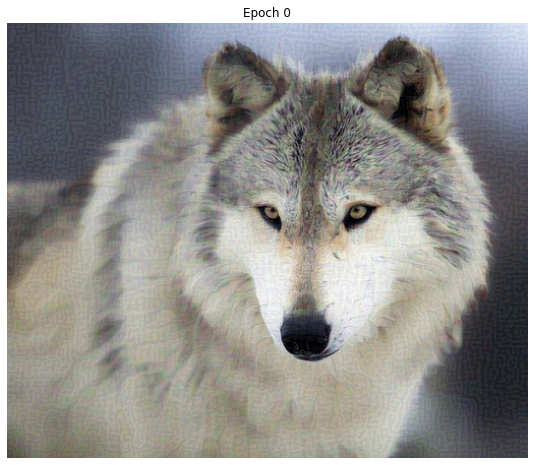

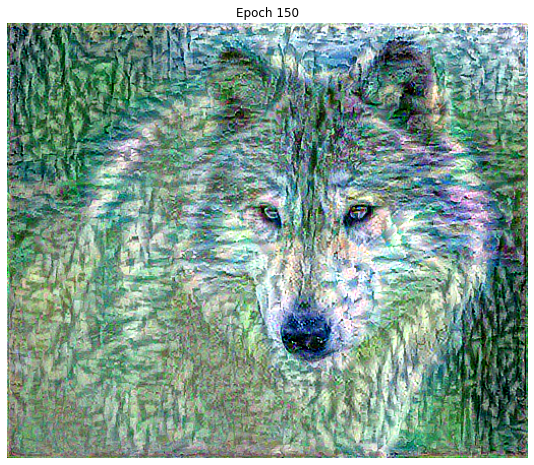

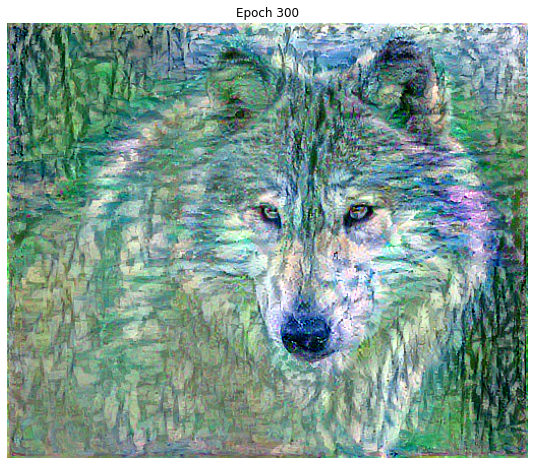

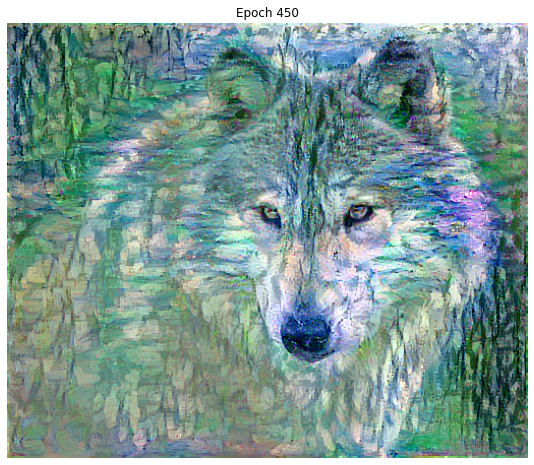

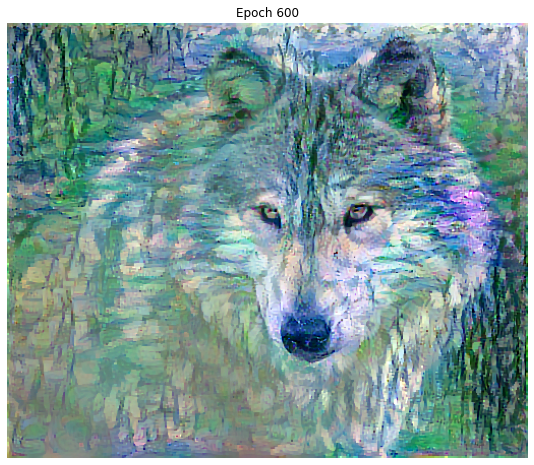

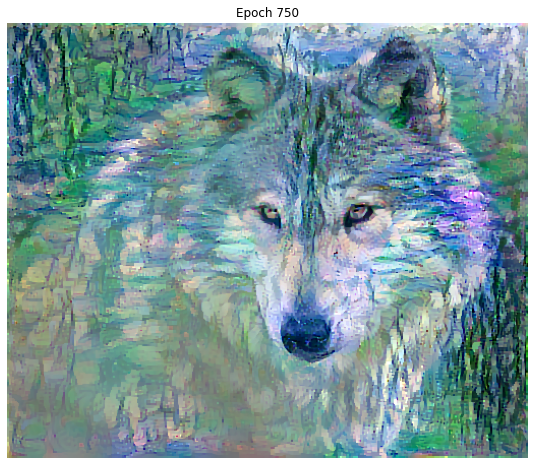

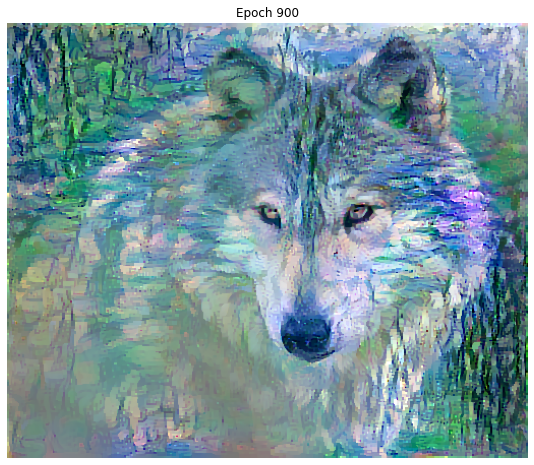

In [83]:
# training with variation constraint

for i in range(epochs):
  train_step(train_image, alpha=content_weight, beta=style_weight)

  if i % 150 == 0:
    image = tensor_to_image(train_image)
    plt.figure(figsize=(16, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f'Epoch {i}')
    plt.show() 

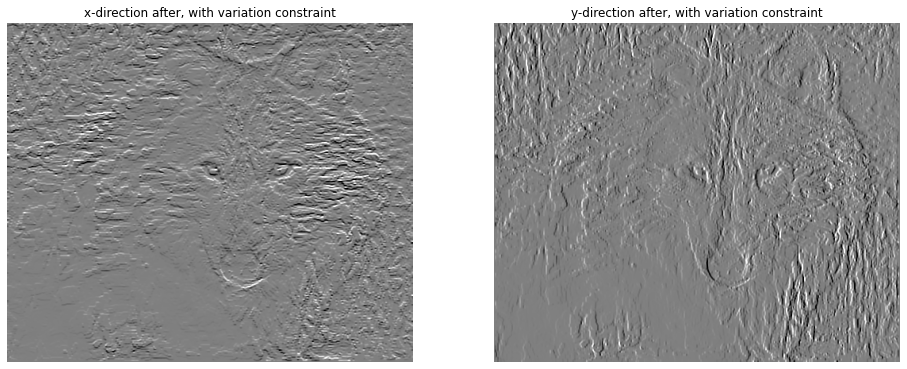

In [84]:
plot_sobel_edges(train_image, label='after, with variation constraint')